<a href="https://colab.research.google.com/github/Offliners/RobotLab-MLDL-Training-2022/blob/main/tutorial-4/colab/tutorial-4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 4 - Anime Face Generation

In [1]:
!nvidia-smi

Wed Jul 20 00:07:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Import packages

In [2]:
import os
import gdown
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import torch
import torchvision
import torch.nn as nn
from tqdm import tqdm
from torch.nn.utils import spectral_norm
import torchvision.transforms as transforms
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter

# Download data

In [3]:
dataset_id = '1ucESV_kFchF6ldW88xSNj2fxIj43yihz'

def download_unzip_file(id, output, output_path):
    gdown.download(id=id, output=output, quiet=False)
    
    if os.path.isfile(output):
        zf = zipfile.ZipFile(output, 'r')
        zf.extractall(output_path)
    else:
        print(f'{output} not found! Please check google drive!')


os.makedirs('./data', exist_ok=True)

output = 'data.zip'
download_unzip_file(dataset_id, output, './')

Downloading...
From: https://drive.google.com/uc?id=1ucESV_kFchF6ldW88xSNj2fxIj43yihz
To: /content/data.zip
100%|██████████| 451M/451M [00:03<00:00, 118MB/s]


# Runtime arguments

In [4]:
class Args:
    def __getitem__(self, key):
        return getattr(self, key)

    def __setitem__(self, key, val):
        setattr(self, key, val)

    #@markdown Random seed
    seed = 3366 #@param

    #@markdown Hyperparameter
    epoch = 50 #@param
    n_critic = 1 #@param
    z_dim = 100 #@param
    train_batchsize =  128#@param
    optimizer = 'Adam' #@param
    lr = 1e-4 #@param
    weight_decay = 0 #@param

    #@markdown Workspace setting
    train_path = './data' #@param
    outdir = './checkpoints/images' #@param
    outvideo = './checkpoints/video' #@param
    video_name = 'output.mp4' #@param
    save_g_model_path = './checkpoints/model/G.pth' #@param
    save_d_model_path = './checkpoints/model/D.pth' #@param
    tensorboard = './checkpoints/tensorboard' #@param


args = Args()

# Build workspace

In [5]:
os.makedirs('./checkpoints', exist_ok=True)
os.makedirs('./checkpoints/model', exist_ok=True)
os.makedirs(args.outdir, exist_ok=True)
os.makedirs(args.outvideo, exist_ok=True)
os.makedirs(args.tensorboard, exist_ok=True)

# Set device

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available():
    torch.cuda.empty_cache()

print(device)

cuda


# Set random seed

In [7]:
def same_seed(seed): 
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

same_seed(args['seed'])

# Some utility functions

In [8]:
def generate_video(image_path, output_video, video_name):
    images = [img for img in os.listdir(image_path) if img.endswith(".jpg")]
    images.sort()
    frame = cv2.imread(os.path.join(image_path, images[0]))
    height, width, layers = frame.shape

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(os.path.join(output_video, video_name), fourcc, 5, (width, height))

    for image in images:
        video.write(cv2.imread(os.path.join(image_path, image)))

    video.release()

# Training loop

In [9]:
def trainer(dataset, writer):
    z_dim = args['z_dim']
    z_sample = Variable(torch.randn(100, z_dim)).to(device)

    G = Generator(in_dim=z_dim).to(device)
    D = Discriminator(3).to(device)

    G.train()
    D.train()

    criterion = nn.BCELoss()
    opt_D = torch.optim.Adam(D.parameters(), lr=args['lr'], betas=(0.5, 0.999))
    opt_G = torch.optim.Adam(G.parameters(), lr=args['lr'], betas=(0.5, 0.999))

    dataloader = DataLoader(dataset, batch_size=args['train_batchsize'], shuffle=True, num_workers=2)

    steps = 0
    for e, epoch in enumerate(range(args['epoch'])):
        progress_bar = tqdm(dataloader)
        for _, data in enumerate(progress_bar):
            imgs = data
            imgs = imgs.to(device)

            bs = imgs.size(0)

            z = Variable(torch.randn(bs, z_dim)).cuda()
            r_imgs = Variable(imgs).cuda()
            f_imgs = G(z)
            r_label = torch.ones((bs)).cuda()
            f_label = torch.zeros((bs)).cuda()
            r_logit = D(r_imgs.detach())
            f_logit = D(f_imgs.detach())
            
            r_loss = criterion(r_logit, r_label)
            f_loss = criterion(f_logit, f_label)
            loss_D = (r_loss + f_loss) / 2

            D.zero_grad()
            loss_D.backward()
            opt_D.step()

            if steps % args['n_critic'] == 0:
                z = Variable(torch.randn(bs, z_dim)).cuda()
                f_imgs = G(z)

                f_logit = D(f_imgs)
                loss_G = criterion(f_logit, r_label)

                G.zero_grad()
                loss_G.backward()

                opt_G.step()

            steps += 1

            progress_bar.set_postfix({
                'Loss_D': round(loss_D.item(), 4),
                'Loss_G': round(loss_G.item(), 4),
                'Epoch': e + 1,
                'Step': steps,
            })

        G.eval()
        f_imgs_sample = (G(z_sample).data + 1) / 2.0
        filename = os.path.join(args['outdir'], f'Epoch_{epoch+1:03d}.jpg')
        torchvision.utils.save_image(f_imgs_sample, filename, nrow=10)
        print(f' | Save some samples to {filename}.')
 
        grid_img = torchvision.utils.make_grid(f_imgs_sample.cpu(), nrow=10)
        writer.add_image('Generated images', grid_img, e)

        G.train()

        torch.save(G.state_dict(), args['save_g_model_path'])
        torch.save(D.state_dict(), args['save_d_model_path'])

    writer.close()

# Dataset

In [10]:
class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames
        self.num_samples = len(self.fnames)

    def __getitem__(self,idx):
        fname = self.fnames[idx]
        img = torchvision.io.read_image(fname)
        img = self.transform(img)
        return img

    def __len__(self):
        return self.num_samples


def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset


dataset = get_dataset(args.train_path)

# Model

In [11]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)


class Generator(nn.Module):
    def __init__(self, in_dim, dim=64):
        super(Generator, self).__init__()
        def dconv_bn_relu(in_dim, out_dim):
            return nn.Sequential(
                nn.ConvTranspose2d(in_dim, out_dim, 5, 2,
                                   padding=2, output_padding=1, bias=False),
                nn.BatchNorm2d(out_dim),
                nn.ReLU()
            )
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, dim * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(dim * 8 * 4 * 4),
            nn.ReLU()
        )
        self.l2_5 = nn.Sequential(
            dconv_bn_relu(dim * 8, dim * 4),
            dconv_bn_relu(dim * 4, dim * 2),
            dconv_bn_relu(dim * 2, dim),
            nn.ConvTranspose2d(dim, 3, 5, 2, padding=2, output_padding=1),
            nn.Tanh()
        )
        self.apply(weights_init)

    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2_5(y)
        return y


class Discriminator(nn.Module):
    def __init__(self, in_dim, dim=64):
        super(Discriminator, self).__init__()

        def conv_bn_lrelu(in_dim, out_dim):
            return nn.Sequential(
                spectral_norm(nn.Conv2d(in_dim, out_dim, 5, 2, 2)),
                nn.LeakyReLU(0.2),
            )

        self.ls = nn.Sequential(
            spectral_norm(nn.Conv2d(in_dim, dim, 5, 2, 2)), 
            nn.LeakyReLU(0.2),
            conv_bn_lrelu(dim, dim * 2),
            conv_bn_lrelu(dim * 2, dim * 4),
            conv_bn_lrelu(dim * 4, dim * 8),
            spectral_norm(nn.Conv2d(dim * 8, 1, 4)),
            nn.Sigmoid(), 
        )
        self.apply(weights_init)
        
    def forward(self, x):
        y = self.ls(x)
        y = y.view(-1)
        return y

# Tensorboard

In [12]:
%reload_ext tensorboard
%tensorboard --logdir=./checkpoints/tensorboard/

<IPython.core.display.Javascript object>

# Show some image 

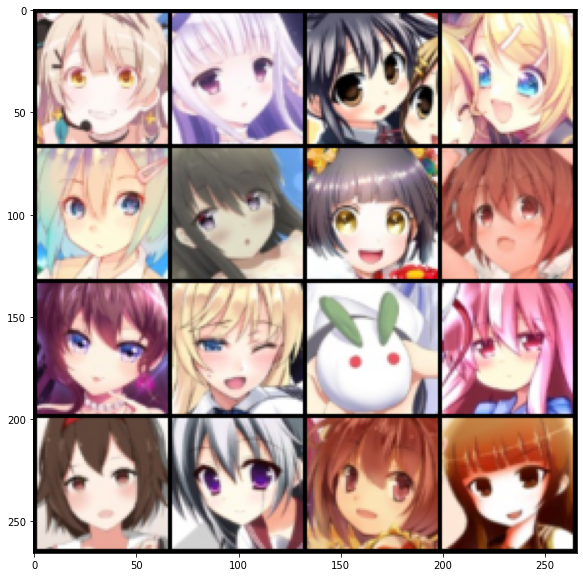

In [13]:
writer = SummaryWriter(args['tensorboard'])
images = [(dataset[i] + 1) / 2 for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)

writer.add_image('Show some images', grid_img)

plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

# Start training!

In [14]:
trainer(dataset, writer)

100%|██████████| 558/558 [03:00<00:00,  3.08it/s, Loss_D=0.83, Loss_G=1.12, Epoch=1, Step=558]


 | Save some samples to ./checkpoints/images/Epoch_001.jpg.


100%|██████████| 558/558 [03:02<00:00,  3.06it/s, Loss_D=0.489, Loss_G=1.42, Epoch=2, Step=1116]


 | Save some samples to ./checkpoints/images/Epoch_002.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.465, Loss_G=1.39, Epoch=3, Step=1674]


 | Save some samples to ./checkpoints/images/Epoch_003.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.477, Loss_G=1.41, Epoch=4, Step=2232]


 | Save some samples to ./checkpoints/images/Epoch_004.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.497, Loss_G=1.29, Epoch=5, Step=2790]


 | Save some samples to ./checkpoints/images/Epoch_005.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.574, Loss_G=1.01, Epoch=6, Step=3348]


 | Save some samples to ./checkpoints/images/Epoch_006.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.443, Loss_G=2.13, Epoch=7, Step=3906]


 | Save some samples to ./checkpoints/images/Epoch_007.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.487, Loss_G=1.14, Epoch=8, Step=4464]


 | Save some samples to ./checkpoints/images/Epoch_008.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.568, Loss_G=1.15, Epoch=9, Step=5022]


 | Save some samples to ./checkpoints/images/Epoch_009.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.482, Loss_G=1.8, Epoch=10, Step=5580]


 | Save some samples to ./checkpoints/images/Epoch_010.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.624, Loss_G=1.34, Epoch=11, Step=6138]


 | Save some samples to ./checkpoints/images/Epoch_011.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.496, Loss_G=0.809, Epoch=12, Step=6696]


 | Save some samples to ./checkpoints/images/Epoch_012.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.544, Loss_G=0.857, Epoch=13, Step=7254]


 | Save some samples to ./checkpoints/images/Epoch_013.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.565, Loss_G=1.41, Epoch=14, Step=7812]


 | Save some samples to ./checkpoints/images/Epoch_014.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.492, Loss_G=1.1, Epoch=15, Step=8370]


 | Save some samples to ./checkpoints/images/Epoch_015.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.58, Loss_G=0.819, Epoch=16, Step=8928]


 | Save some samples to ./checkpoints/images/Epoch_016.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.00it/s, Loss_D=0.59, Loss_G=1.22, Epoch=17, Step=9486]


 | Save some samples to ./checkpoints/images/Epoch_017.jpg.


100%|██████████| 558/558 [03:06<00:00,  3.00it/s, Loss_D=0.597, Loss_G=0.805, Epoch=18, Step=1e+4]


 | Save some samples to ./checkpoints/images/Epoch_018.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.562, Loss_G=0.978, Epoch=19, Step=10602]


 | Save some samples to ./checkpoints/images/Epoch_019.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.545, Loss_G=1.14, Epoch=20, Step=11160]


 | Save some samples to ./checkpoints/images/Epoch_020.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.65, Loss_G=0.602, Epoch=21, Step=11718]


 | Save some samples to ./checkpoints/images/Epoch_021.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.605, Loss_G=0.941, Epoch=22, Step=12276]


 | Save some samples to ./checkpoints/images/Epoch_022.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.523, Loss_G=1.34, Epoch=23, Step=12834]


 | Save some samples to ./checkpoints/images/Epoch_023.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.576, Loss_G=0.893, Epoch=24, Step=13392]


 | Save some samples to ./checkpoints/images/Epoch_024.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.554, Loss_G=0.98, Epoch=25, Step=13950]


 | Save some samples to ./checkpoints/images/Epoch_025.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.548, Loss_G=0.981, Epoch=26, Step=14508]


 | Save some samples to ./checkpoints/images/Epoch_026.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.589, Loss_G=1.06, Epoch=27, Step=15066]


 | Save some samples to ./checkpoints/images/Epoch_027.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.615, Loss_G=0.884, Epoch=28, Step=15624]


 | Save some samples to ./checkpoints/images/Epoch_028.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.592, Loss_G=0.836, Epoch=29, Step=16182]


 | Save some samples to ./checkpoints/images/Epoch_029.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.548, Loss_G=0.948, Epoch=30, Step=16740]


 | Save some samples to ./checkpoints/images/Epoch_030.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.593, Loss_G=0.886, Epoch=31, Step=17298]


 | Save some samples to ./checkpoints/images/Epoch_031.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.569, Loss_G=0.82, Epoch=32, Step=17856]


 | Save some samples to ./checkpoints/images/Epoch_032.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.588, Loss_G=1.03, Epoch=33, Step=18414]


 | Save some samples to ./checkpoints/images/Epoch_033.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.625, Loss_G=1.18, Epoch=34, Step=18972]


 | Save some samples to ./checkpoints/images/Epoch_034.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.00it/s, Loss_D=0.57, Loss_G=1.31, Epoch=35, Step=19530]


 | Save some samples to ./checkpoints/images/Epoch_035.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.00it/s, Loss_D=0.68, Loss_G=0.942, Epoch=36, Step=20088]


 | Save some samples to ./checkpoints/images/Epoch_036.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.00it/s, Loss_D=0.583, Loss_G=1.15, Epoch=37, Step=20646]


 | Save some samples to ./checkpoints/images/Epoch_037.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.643, Loss_G=0.789, Epoch=38, Step=21204]


 | Save some samples to ./checkpoints/images/Epoch_038.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.02it/s, Loss_D=0.607, Loss_G=0.867, Epoch=39, Step=21762]


 | Save some samples to ./checkpoints/images/Epoch_039.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.655, Loss_G=0.83, Epoch=40, Step=22320]


 | Save some samples to ./checkpoints/images/Epoch_040.jpg.


100%|██████████| 558/558 [03:05<00:00,  3.01it/s, Loss_D=0.601, Loss_G=1.06, Epoch=41, Step=22878]


 | Save some samples to ./checkpoints/images/Epoch_041.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.594, Loss_G=1.13, Epoch=42, Step=23436]


 | Save some samples to ./checkpoints/images/Epoch_042.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.609, Loss_G=0.876, Epoch=43, Step=23994]


 | Save some samples to ./checkpoints/images/Epoch_043.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.613, Loss_G=1.03, Epoch=44, Step=24552]


 | Save some samples to ./checkpoints/images/Epoch_044.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.579, Loss_G=0.902, Epoch=45, Step=25110]


 | Save some samples to ./checkpoints/images/Epoch_045.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.596, Loss_G=0.918, Epoch=46, Step=25668]


 | Save some samples to ./checkpoints/images/Epoch_046.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.581, Loss_G=0.818, Epoch=47, Step=26226]


 | Save some samples to ./checkpoints/images/Epoch_047.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.645, Loss_G=1.11, Epoch=48, Step=26784]


 | Save some samples to ./checkpoints/images/Epoch_048.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.617, Loss_G=0.959, Epoch=49, Step=27342]


 | Save some samples to ./checkpoints/images/Epoch_049.jpg.


100%|██████████| 558/558 [03:04<00:00,  3.02it/s, Loss_D=0.55, Loss_G=0.905, Epoch=50, Step=27900]


 | Save some samples to ./checkpoints/images/Epoch_050.jpg.


# Generate result video

In [15]:
generate_video(args['outdir'], args['outvideo'], args['video_name'])

# Download result video

In [16]:
from google.colab import files
files.download(os.path.join(args['outvideo'], args['video_name']))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>